<a href="https://colab.research.google.com/github/AmirMansurian/Panorama-Musaicing/blob/main/mosiacing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Panorama Mosaicing
#### Here we want to use scene from a place and create panorama image from these scenes. first we implement Harris corner detection to extract good points from images. then we implement RANSAC algorithm to detect inliers and compute Hemography matrix between two images. at last with H matrix we can create Panoroma image.

In [1]:
import numpy as np
import cv2
from sklearn.metrics import mean_squared_error
import scipy.io
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import scipy.ndimage as ndi
import skimage.feature as sf

# Harris Corner Detection
#### funtion below gets an image and extracts it's corner points.it takes an argument k for computing harris response of each point and window size for gussian smoothing filter. here we use sobel filter to compute horizental and vertical edges.after computing harris responses we check points to determin if they are grater than a threshold. here we use 0.01* largest harris response as threshold. and at last we use local non-maxima suppresion to get local maximas. this function returns good corner candidates.
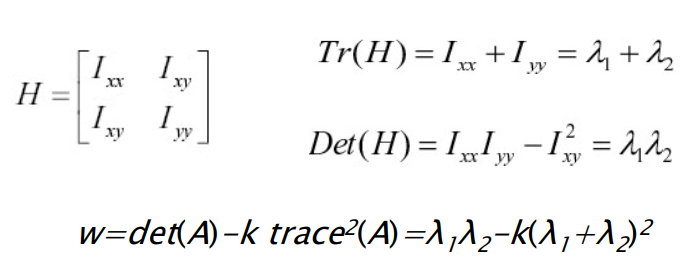

In [4]:
def Harris(img, k, window_size): #Offeset = determine size of a window
  
  Ix = cv2.Sobel(image1,cv2.CV_64F,1,0,ksize=3)  # x
  Iy = cv2.Sobel(image1,cv2.CV_64F,0,1,ksize=3)  # y

  Ixx = ndi.gaussian_filter(Ix**2, sigma=1)
  Ixy = ndi.gaussian_filter(Iy*Ix, sigma=1)
  Iyy = ndi.gaussian_filter(Iy**2, sigma=1)

  detH = Ixx * Iyy - Ixy * Ixy
  traceH = Ixx + Iyy
  harris_response = detH - k * traceH ** 2

  height, width = img.shape

  cornerList = []
  newImg = img.copy()
  color_img = cv2.cvtColor(newImg, cv2.COLOR_GRAY2RGB)
  offset = int(window_size/2)

  R = np.zeros((height, width), np.float32)

  for y in range(offset, height-offset):
      for x in range(offset, width-offset):
          windowIxx = Ixx[y-offset:y+offset+1, x-offset:x+offset+1]
          windowIxy = Ixy[y-offset:y+offset+1, x-offset:x+offset+1]
          windowIyy = Iyy[y-offset:y+offset+1, x-offset:x+offset+1]
          Sxx = windowIxx.sum()
          Sxy = windowIxy.sum()
          Syy = windowIyy.sum()

          #Find determinant and trace, use to get corner response
          det = (Sxx * Syy) - (Sxy**2)
          trace = Sxx + Syy
          r = det - k*(trace**2)
          
          R[y, x] = r


  thresh = R.max() * 0.01
  bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
  PointList = []
  for i in range(height):
      for j in range(width):
          if R[i][j] > thresh:
              # print(R[row][col])
              max = R[i][j]
              
              # Local non-maxima suppression
              skip = False
              for nrow in range(5):
                  for ncol in range(5):
                      if i + nrow - 2 < height and j + ncol - 2 < width:
                          if R[i + nrow - 2][j + ncol - 2] > max:
                              skip = True
                              break

              if not skip:
                  PointList.append((i, j))  

  
  return PointList

## Test harris corner detection
#### here we test harris functon and draw detected corners : 

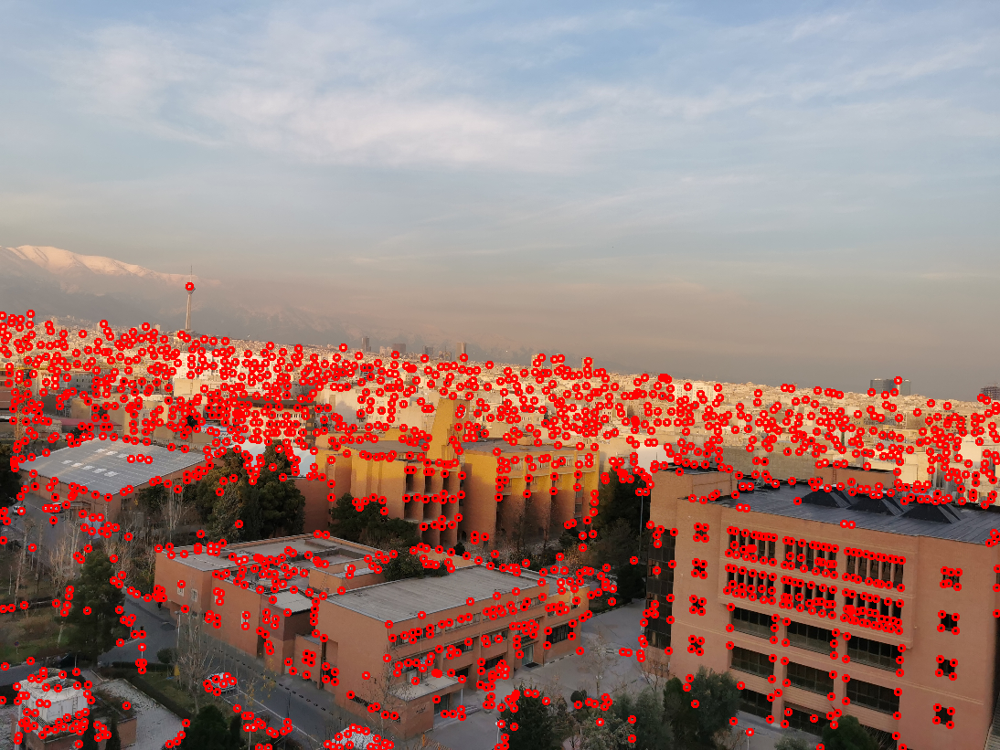

In [3]:
image1 = cv2.imread('1.png')
gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

corners = Harris(gray, 0.04, 5)

radius = 3
color = (0, 0, 255)  # Red
thickness = 2

for (i,j) in corners : 
  cv2.circle(image1, (j, i), radius, color, thickness)

cv2_imshow(image1)

# Ransac
#### In this section we implement RANSAC algorithm to detect inliers and use them for calculating hemography matrix. In this section we use some function.
#### function below, gets two images and their correspondece points and also inliers and returns two images. one with ploted inliers and other with outliers.



In [5]:
def drawInliersOutliers(image1, image2, point_map, inliers):
    """
    inliers: set of (x1, y1) points
    """
    BLUE = (255, 0, 0)
    GREEN = (0, 255, 0)
    RED = (0, 0, 255)

    rows1, cols1, dep = image1.shape
    rows2, cols2, dep = image2.shape

    matchImage = np.zeros((max(rows1, rows2), cols1 + cols2, 3), dtype='uint8')
    matchImage[:rows1, :cols1, :] = np.dstack([image1])
    matchImage[:rows2, cols1:cols1 + cols2, :] = np.dstack([image2])

    matchImage2 = np.zeros((max(rows1, rows2), cols1 + cols2, 3), dtype='uint8')
    matchImage2[:rows1, :cols1, :] = np.dstack([image1])
    matchImage2[:rows2, cols1:cols1 + cols2, :] = np.dstack([image2])

    # draw lines
    for x1, y1, x2, y2 in point_map:
        point1 = (int(x1), int(y1))
        point2 = (int(x2 + image1.shape[1]), int(y2))
        if (x1, y1, x2, y2) in inliers : 
          cv2.line(matchImage, point1, point2, GREEN, 1)
        else : 
          cv2.line(matchImage2, point1, point2, RED, 1)

    return matchImage, matchImage2

## Dist function
#### this function gets correspondence points and Hemography matrix and returns reprojection error between points of two scenes

In [6]:
def dist(pair, H):
    """ Returns the geometric distance between a pair of points given the
    homography H. """
    
    # points in homogeneous coordinates
    p1 = np.array([pair[0], pair[1], 1])
    p2 = np.array([pair[2], pair[3], 1])

    p2_estimate = np.dot(H, np.transpose(p1))
    p2_estimate = (1 / p2_estimate[2]) * p2_estimate
    
    return np.linalg.norm(np.transpose(p2) - p2_estimate)

## RANSAC algorithm
#### Here I have implemented RANSAC algorithm. this funtion gets correspondence points and a threshold for reprojection error. in each iteration it picks randomly 4 correspondences and calculate H matrix and calculate reprojection matrix with dist functoin and check it with threshold. if we want to find inliers with p = 99%, and ratio of inliers w = 0.6 and because hemography needs m=4 points :
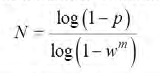

In [18]:
def RANSAC (point_map, thresh) :

  NUM_ITERS = 1000
  bestInliers = set()
  homography = None

  for i in range(NUM_ITERS):

    pairs = point_map[np.random.randint(len(point_map), size=4)]
    H, status = cv2.findHomography(pairs[:, 0:2], pairs[:, 2:4])
    inliers = {(c[0], c[1], c[2], c[3]) for c in point_map if dist(c, H) < thresh}

    if len(inliers) > len(bestInliers):
      bestInliers = inliers
      homography = H
      if len(bestInliers) > (len(point_map) * 0.6): break

  return bestInliers, homography

## Draw inliers and outliers
#### In this section first we draw key points of images and connect each coorespondece points with a line. then using RANSAC function we calculate inliers and outliers and draw them  as well. green lines shows inliers and red lines shows outliers : 

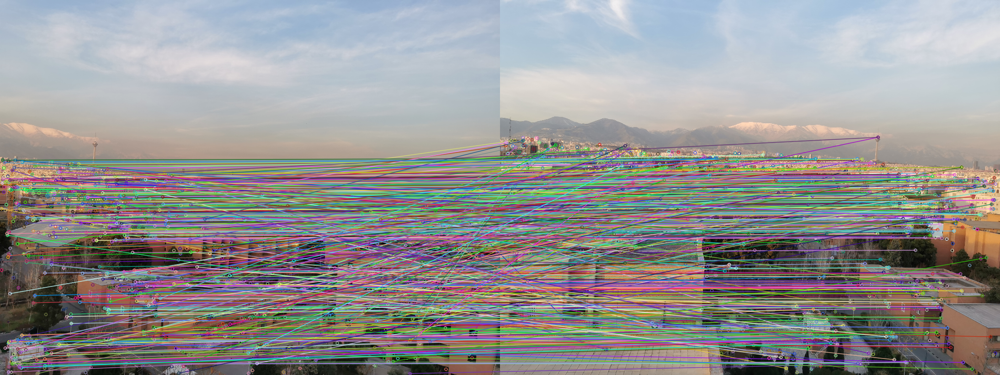

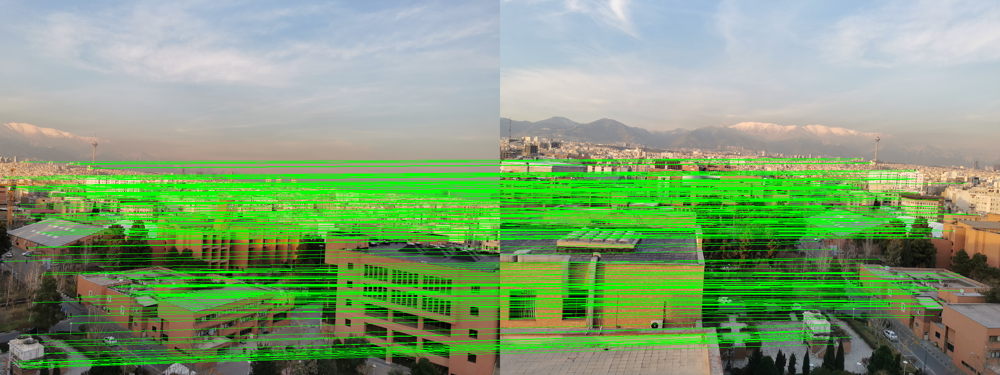

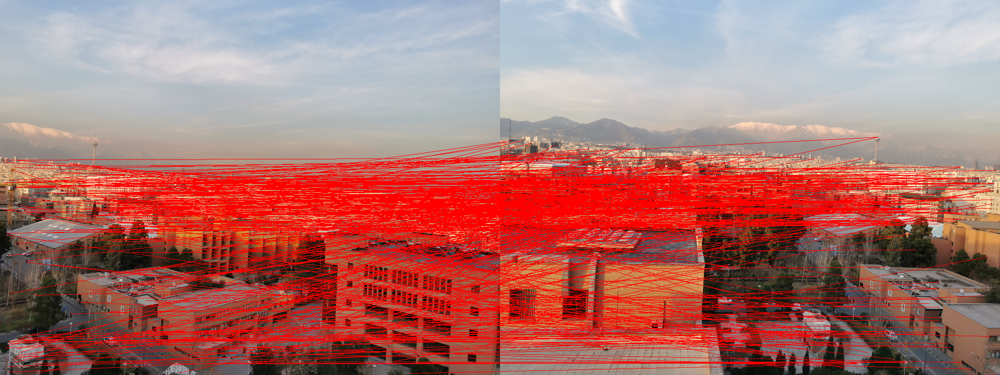

In [19]:
image1 = cv2.imread('1.png')
image2 = cv2.imread('2.png')

gray1= cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
gray2= cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create(nfeatures=2000)
kp1, desc1 = sift.detectAndCompute(gray1, None)
kp2, desc2 = sift.detectAndCompute(gray2, None)

matches = cv2.BFMatcher(cv2.NORM_L2, True).match(desc1, desc2)
point_map = np.array([
          [kp1[match.queryIdx].pt[0],
          kp1[match.queryIdx].pt[1],
          kp2[match.trainIdx].pt[0],
          kp2[match.trainIdx].pt[1]] for match in matches
      ])
  
img3 = cv2.drawMatches(image1, kp1, image2, kp2, matches, None)
cv2_imshow(img3)

inliers, H = RANSAC(point_map, 1)

inlier, outlier = drawInliersOutliers(image1, point_map, inliers)
cv2_imshow(inlier)
cv2_imshow(outlier)

# Musaicing
#### In the last section we want to create panorama image. function below gets two images and H matrix related to these images and using cv2 returns panorama image.

In [2]:
def stitch(img1, img2, hom):
  rows1, cols1 = img1.shape[:2]
  rows2, cols2 = img2.shape[:2]

  #Corners of img1 & img2
  corners1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  corners2 = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)
  #Project 4 corners of image2 onto image1
  project = cv2.perspectiveTransform(corners2, hom)

  points = np.concatenate((corners1, project), axis = 0)

  [x_min, y_min] = np.int32(points.min(axis = 0).ravel() - 0.5)
  [x_max, y_max] = np.int32(points.max(axis = 0).ravel() + 0.5)
  
  translation_dist = [-x_min,-y_min]
  
  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  result = cv2.warpPerspective(img2, H_translation.dot(hom), (x_max - x_min, y_max - y_min))
  result[translation_dist[1] : rows1 + translation_dist[1], translation_dist[0] : cols1 + translation_dist[0]] = img1

  return result

## Panorama result
#### We use stich function above and create panorama image :

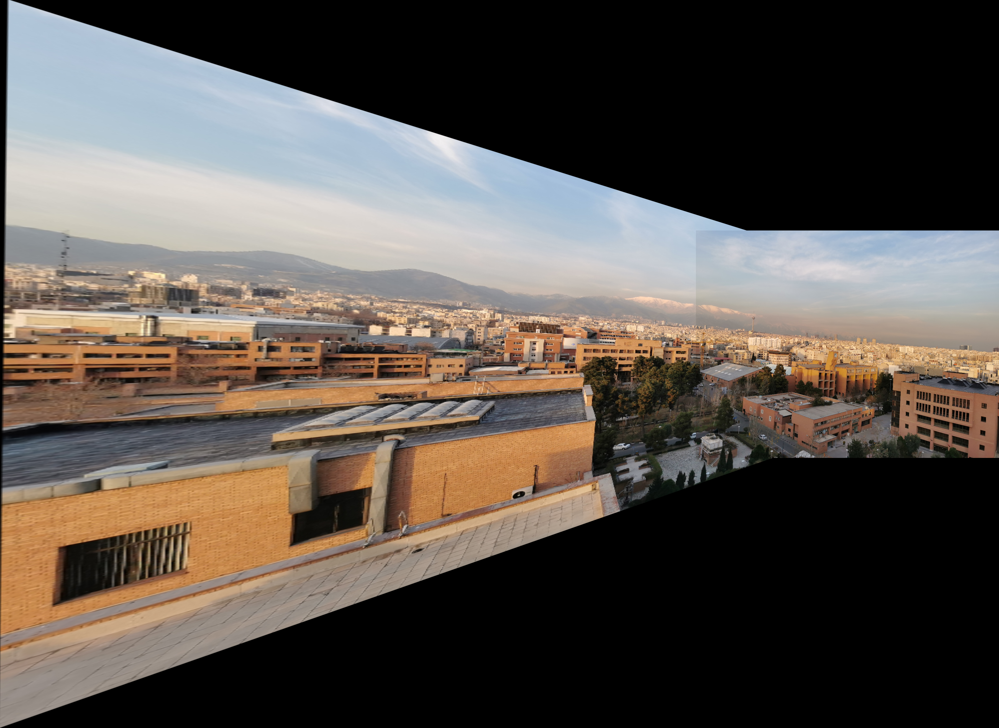

In [ ]:
image1 = cv2.imread('1.png')
image2 = cv2.imread('2.png')
H_inv = np.linalg.inv(H)
stitchedImage = stitch(image1, image2, H_inv)
cv2_imshow(stitchedImage)